<font style="font-size:96px; font-weight:bolder; color:#0040a0"><img src="http://montage.ipac.caltech.edu/docs/M51_logo.png" alt="M" style="float: left; padding: 25px 30px 25px 0px;" /></font>

<i><b>Montage</b> is a general astronomical image toolkit with facilities for reprojection, background matching, coaddition and visualization.  It can be used as a set of command-line tools (Linux, OS X and Windows), C library calls (Linux and OS X) and as Python binary extension modules.</i>
    
<i>Montage source code can be downloaded from GitHub ( https://github.com/Caltech-IPAC/Montage ).  The Python package can be installed from PyPI ("pip install MontagePy"). See
http://montage.ipac.caltech.edu/ for more information.</i>

# MontagePy.main modules: mBgExec

A large percentage of the Montage modules focus on processing a set of images (often retrieved from a mission archive); projecting them to a common frame, adjusting their background levels as a set, and coadding them into a mosaic.

This page is focused on the details of one of these modules: mBgExec.  For a broader context, please see <a href="Mosaic.ipynb">Building a Mosaic with Montage</a> or the <a href="Mosaic_oneshot.ipynb"> one shot </a> version if you just want to see the commands.

<b>Note:</b> The MontagePy python package has no external dependencies. We include other utilities on this page to aid in visualizing MontagePy package results.


In [1]:
from MontagePy.main import mBgExec, mViewer

help(mBgExec)

Help on built-in function mBgExec in module MontagePy.main:

mBgExec(...)
    mBgExec takes the background correction for each image (usually from mBgModel) and subtracts it using mBackground.
    
    Parameters
    ----------
    path : str
        Path to input image directory.
    tblfile : str
        Table file list of images to correct.
    fitfile : str
        Table of background correction parameters.
    corrdir : str
        Directory for output corrected images.
    noAreas : bool, optional
        Flag indicating there are no area images.
    debug : int, optional
        Debugging output level.
    
    
    Returns
    -------
    status : int
        Return status (0: OK, 1:ERROR).
    msg : str
        Return message (for errors).
    count : int
        Total number of images.
    nocorrection : int
        Number of images with no correction parameters.
    failed : int
        Number of images where the correction failed.



## mBgExec Example

If we coadd a set of reprojected 2MASS images after reprojection but without doing anything about the backgrounds, the differences in background levels are obvious:

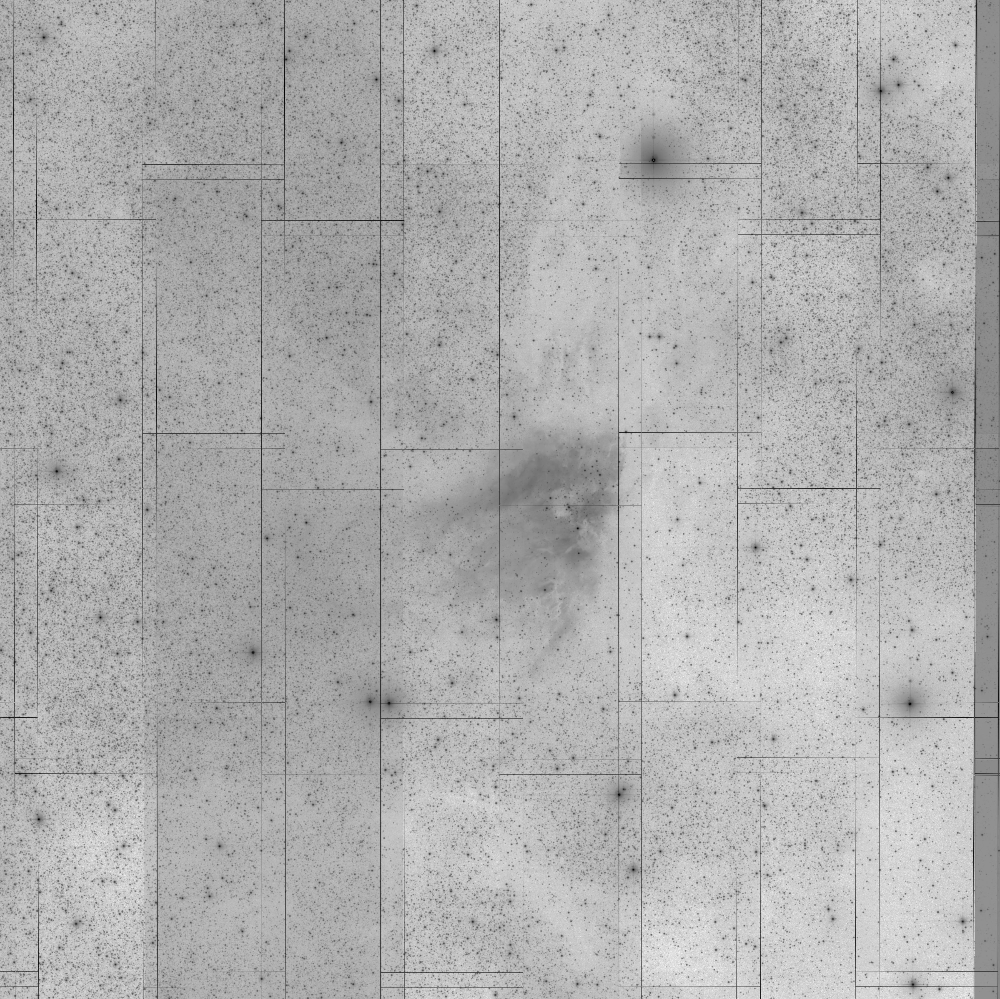

In [5]:
from IPython.display import Image

mViewer('-color black -imginfo M17/rimages.tbl \
         -ct 1 -gray M17/uncorrected.fits -2s max gaussian-log \
         -out work/M17/uncorrected.png',
        '', mode=2)

Image(filename='work/M17/uncorrected.png')

&nbsp;<p/>

Through the background modeling, we can derive a set of corrections to the individual images (the "id" in this table is a reference to the images metadata table shown as an overlay above).

In [6]:
import pandas as pd
from astropy.io import ascii
ipactable = ascii.read('M17/corrections.tbl').to_pandas()
ipactable

,id,a,b,c
0,0,0.000907,0.001942,-8.773330
1,8,0.000224,0.001593,-10.007300
2,9,0.001333,-0.000788,-13.112400
3,13,0.000368,0.000673,-9.036830
4,14,0.000188,0.001220,-8.722280
5,21,0.000840,0.001092,-8.212320
6,24,0.000589,0.003644,-5.954610
7,29,0.000048,0.000451,73.046300
8,31,-0.000693,0.001017,72.364000
9,1,0.000141,0.000352,-6.415340


&nbsp;

With mBgExec, we can apply these corrections to the original image:

In [8]:
rtn = mBgExec('M17/projected',
              'M17/pimages.tbl', 
              'M17/corrections.tbl', 
              'work/M17/corrected')
print(rtn)

{'status': '0', 'count': 49, 'nocorrection': 0, 'failed': 0}


&nbsp;<p/>

and after coadding the corrected images together, we get:

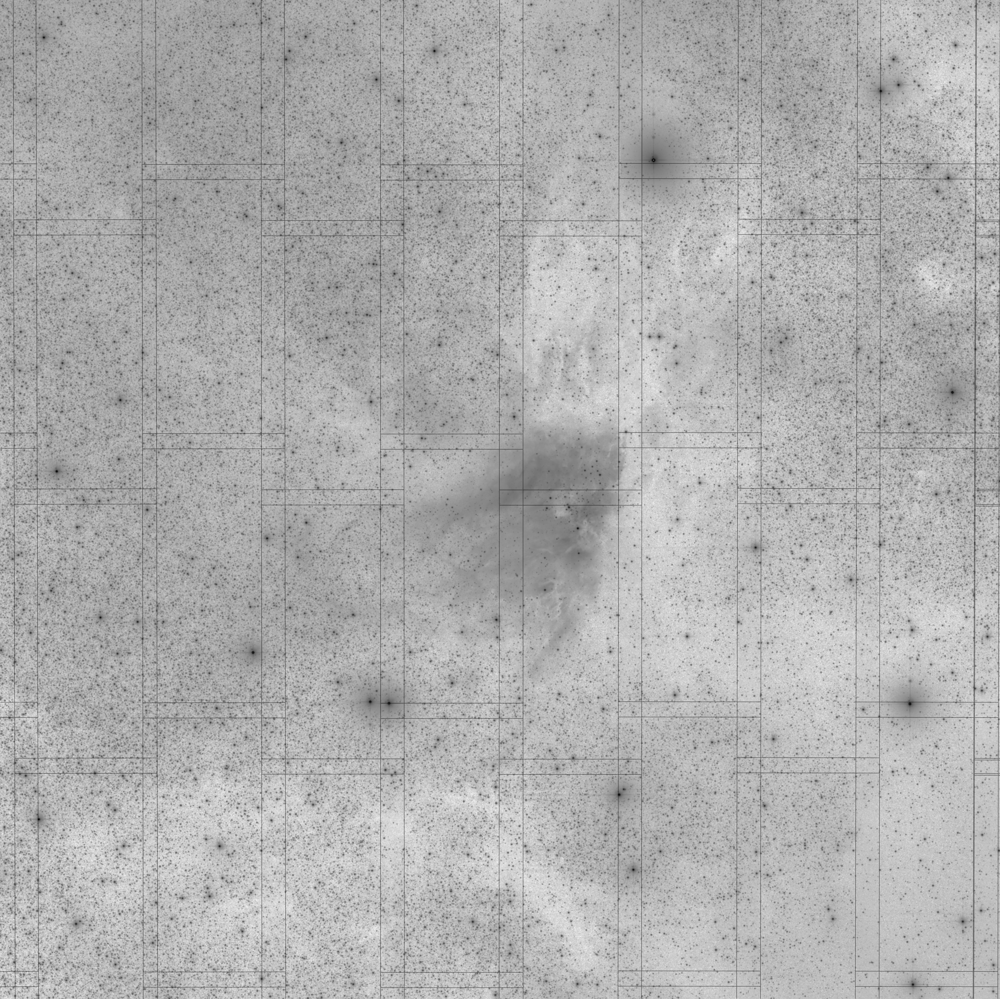

In [9]:
mViewer('-color black -imginfo M17/rimages.tbl \
         -ct 1 -gray M17/mosaic.fits -2s max gaussian-log \
         -out work/mosaic_bgexec.png',
        '', mode=2)

Image(filename='work/mosaic_bgexec.png')

Montage functions return JSON structures.  They always include a status (0: success; 1: error) and a variable number of informational parameters.

&nbsp;

## mBgExec Error Handling

If mBgExec encounters an error, the return structure will just have two elements: a status of 1 ("error") and a message string that tries to diagnose the reason for the error.

For instance, if the user asks for an invalid file:

In [10]:
rtn = mBgExec('M17/projected', 
              'M17/unknown.tbl', 
              'M17/corrections.tbl', 
              "work/M17/corrected")
print(rtn)

{'status': '1', 'msg': b'Invalid image metadata file: M17/unknown.tbl'}


&nbsp;

## Classic Montage: mBgExec as a Stand-Alone Program

### mBgExec Unix/Windows Command-line Arguments

<p>mBgExec can also be run as a command-line tool in Linux, OS X, and Windows:</p>

<p><tt>
<b>Usage:</b> mBgExec [-p projdir] [-s statusfile] [-d] [-n(o-areas)] images.tbl corrections.tbl corrdir
</tt></p>
<p>&nbsp;</p>
<p>If you are writing in C/C++, mBgExec can be accessed as a library function:</p>


<pre>
/*-*****************************************************************/
/*                                                                 */
/*  mBgExec                                                        */
/*                                                                 */
/*  Take the background correction determined for each image and   */
/*  subtract it using mBackground.                                 */
/*                                                                 */
/*   char *path       Path to images to be background-corrected    */
/*   char *tblfile    Table file list of images to correct         */
/*   char *fitfile    Table of background levels/slopes            */
/*   char *corrdir    Directory for corrected images               */
/*   int noAreas      Flag indicating there are no area images.    */
/*   int debug        Debug flag.                                  */
/*                                                                 */
/*******************************************************************/

struct mBgExecReturn *mBgExec(char *path, char *tblfile, char *fitfile, char *corrdir, int noAreas, int debug)
</pre>
<p><b>Return Structure</b></p>
<pre>
struct mBgExecReturn
{
   int    status;        // Return status (0: OK, 1:ERROR)
   char   msg [1024];    // Return message (for error return)
   char   json[4096];    // Return parameters as JSON string
   int    count;         // Number of images
   int    nocorrection;  // Number of images for which there was no correction 
   int    failed;        // Number of images where correction failed
};
</pre>